In [55]:
import os
import torch
import yaml
import glob
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from PIL import Image
import numpy as np
import cv2
from pytorch_grad_cam import GradCAM,ScoreCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import math

In [56]:
def extract_files():
    import google.colab
    import zipfile

    google.colab.drive.mount('/content/drive')
    PROJECT_DIR = "/content/drive/MyDrive/thesis/data/"

    zip_ref = zipfile.ZipFile(PROJECT_DIR + "fiveK.zip", 'r')
    zip_ref.extractall(".")
    zip_ref.close()

In [57]:
if 'google.colab' in str(get_ipython()):
  extract_files()
  config_path = "/content/drive/MyDrive/thesis/config.yaml"
else:
  config_path = "../../config.yaml"

In [58]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [59]:
try:
    # Load configuration
    with open(config_path, 'r') as config_file:
        config = yaml.safe_load(config_file)
except:
    raise FileNotFoundError(f"Config file not found at path: {config_path}")

In [60]:
base_checkpoint_path = config['paths']['checkpoints']

In [61]:
def load_best_checkpoint(checkpoint_dir):
    # Check if the directory exists
    if not os.path.exists(base_checkpoint_path):
        print(f"No directory found: {checkpoint_dir}")
        return None
      # Get a list of all checkpoint files in the directory
    checkpoint_files = glob.glob(os.path.join(checkpoint_dir, f'{os.path.basename(checkpoint_dir)}_*.pth'))

    # Check if any checkpoint files are present
    if not checkpoint_files:
        print(f"No checkpoints found in the directory: {checkpoint_dir}")
        return None

    # Sort checkpoint files by their names
    checkpoint_files = sorted(checkpoint_files, key=lambda x: int(x.split('_')[-1].split('.')[0]))

    best_accuracy = 0.0
    accuracies = []
    epochs = []
    lossess = []
    for checkpoint_file in checkpoint_files:
        checkpoint = torch.load(checkpoint_file, map_location=torch.device(device))
        accuracies.append(checkpoint['accuracy'].cpu())
        epochs.append(checkpoint['epoch'])
        lossess.append(checkpoint['loss'])
        if best_accuracy < checkpoint['accuracy']:
            best_accuracy = checkpoint['accuracy']
            best_checkpoint = checkpoint

    return best_checkpoint, accuracies, epochs, lossess

In [62]:
checkpoint, accuracies, epochs, losses = load_best_checkpoint(base_checkpoint_path)

<class 'int'>


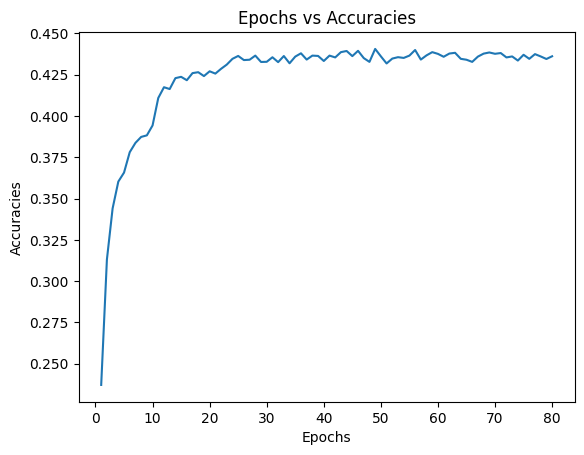

In [63]:
# Draw the plot between epochs and accuracies
print(type(epochs[0]))
import matplotlib.pyplot as plt
plt.plot(epochs, accuracies)
plt.xlabel('Epochs')
plt.ylabel('Accuracies')
plt.title('Epochs vs Accuracies')
plt.show()

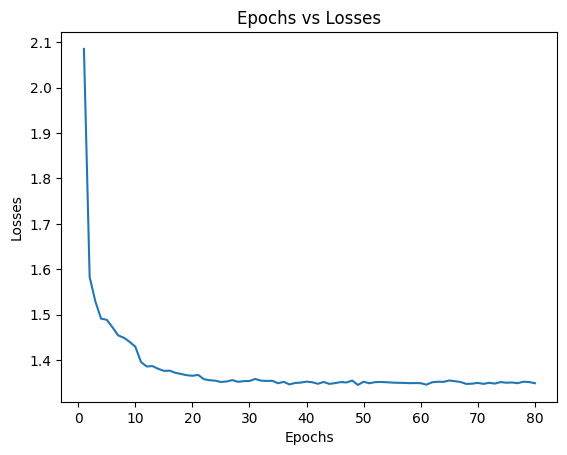

In [64]:
# Draw the plot between epochs and accuracies
import matplotlib.pyplot as plt
plt.plot(epochs, losses)
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Epochs vs Losses')
plt.show()

In [65]:
print(checkpoint['accuracy'])

tensor(0.4406, dtype=torch.float64)


In [66]:
model_name = config['model']['name']
if not model_name.startswith('resnet'):
    raise ValueError("Model name must start with 'resnet'")

In [67]:
if config['model']['type'] == 'FEATURE_EXTRACTOR':
    model = torchvision.models.__dict__[model_name](weights='IMAGENET1K_V1')
    # Freeze all layers except the fully connected layers
    for param in model.parameters():
        param.requires_grad = False
elif config['model']['type'] == 'FINE_TUNING':
    model = torchvision.models.__dict__[model_name](weights='IMAGENET1K_V1')
elif config['model']['type'] == 'TRAIN_FROM_SCRATCH':
    model = torchvision.models.__dict__[model_name](weights=None)
else:
    raise ValueError(f"Unknown model type: {config['model']['type']}")

num_ftrs = model.fc.in_features

model.fc = nn.Linear(num_ftrs, config['model']['num_classes'])

model = model.to(device)

In [68]:
model.load_state_dict(checkpoint['state_dict'])
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [69]:
print(checkpoint['epoch'])

49


In [70]:
# List of class directories
class_directories = ['expA', 'expB', 'expC', 'expD', 'expE']
# raw data directory
raw_dir = "raw"

In [71]:
class CustomDataset(Dataset):
    def __init__(self, data_dir, filename, transform=None):
        super().__init__()
        self.filename = filename
        self.transform = transform
        self.encode = {k: i for i, k in enumerate(class_directories)}
        
        # Read the train.txt file and store the image paths
        with open(self.filename) as f:
            img_paths= []
            for line in f:
                line = line.strip()
                for class_dir in class_directories:
                    img_paths.append(os.path.join(data_dir, class_dir, line))

            self.image_paths = img_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        class_name = self._extract_class_name(os.path.dirname(image_path))
        image = Image.open(image_path)
        label = self.encode[class_name]
        if self.transform is not None:
            image = self.transform(image)
        return image, label

    def _extract_class_name(self, root_dir):
        # Extract the class name from the root directory
        class_name = os.path.basename(root_dir)
        return class_name

In [72]:
data_folder = config['paths']['data']
test_file = config['paths']['test']

In [73]:
test_files = []
with open(test_file) as f:
    for line in f:
        for class_dir in class_directories:
            test_files.append(os.path.join(data_folder, class_dir, line.strip()))

In [74]:
def read_dataset(data_folder, txt_file, trasform=None):
    # Create separate datasets for each class
    data = CustomDataset(
        data_dir=os.path.join(data_folder),
        filename=os.path.join(txt_file),
        transform=trasform
    )
    return data

In [75]:
test_tr = transforms.Compose([
        transforms.ToTensor(),
        transforms.CenterCrop(224),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

In [76]:
test_dataset = read_dataset(data_folder, test_file, test_tr)


In [77]:
bs = 1

In [78]:
test_dataloader = DataLoader(test_dataset, batch_size=bs, shuffle=False)

In [79]:
# target layers are the last layer of the model before the global average pooling and the fully connected layer
target_layers = [model.layer4[-1]]
gradcam = GradCAM(model=model, target_layers=target_layers)

In [80]:
# copy all the images in the input tensor 
input_tensor = torch.cat([images for images, _ in test_dataloader], dim=0)

RuntimeError: The size of tensor a (3) must match the size of tensor b (6) at non-singleton dimension 0

In [ ]:
# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = gradcam(input_tensor=input_tensor, targets=None)

RuntimeError: Given groups=1, weight of size [64, 3, 7, 7], expected input[20, 6, 224, 224] to have 3 channels, but got 6 channels instead

In [ ]:
def preprocess_image_grad(image):
    # image = np.array(image)
    center_crop_transform = transforms.CenterCrop(224)
    cropped_image = center_crop_transform(image)
    image = np.float32(cropped_image) / 255
    return image

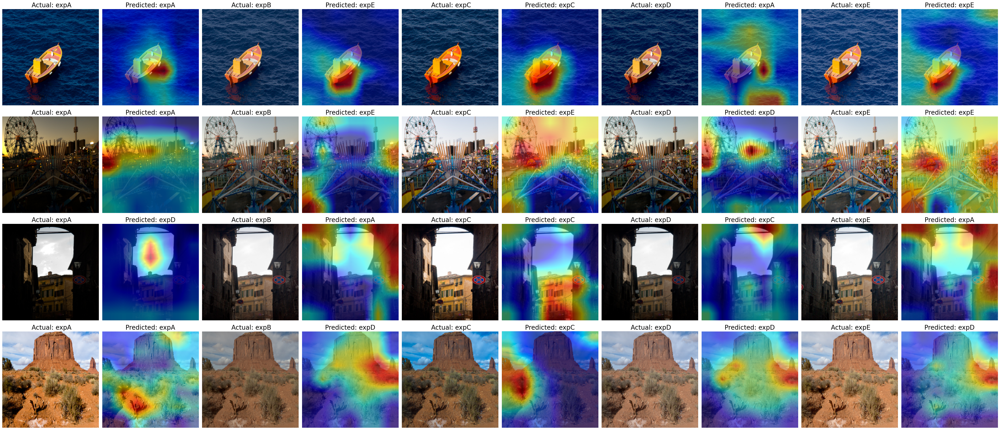

In [ ]:
num_images_per_row = 10
num_images = len(test_files) * 2

num_rows = math.ceil(num_images / num_images_per_row)
fig, axs = plt.subplots(num_rows, num_images_per_row, figsize=(11 * num_rows, 4.8 * num_rows))

model_outputs = gradcam.outputs
for i, (images, labels) in enumerate(test_dataloader):
    org_img_path = test_files[i]
    
    rgb_img = Image.open(org_img_path)

    preprocessed_rgb_image = preprocess_image_grad(rgb_img)
    max_label = torch.argmax(model_outputs[i])
    visualization = show_cam_on_image(preprocessed_rgb_image, grayscale_cam[i,:], use_rgb=True)

    row = (i * 2) // num_images_per_row
    col = i % num_images_per_row * 2
    if num_rows > 1:
        axs[row, col % num_images_per_row].imshow(preprocessed_rgb_image)
        axs[row, col % num_images_per_row].set_title(f" Actual: {class_directories[labels[0]]}", fontsize=20)
        axs[row, (col + 1) % num_images_per_row].imshow(visualization)
        axs[row, (col + 1) % num_images_per_row].set_title(f"Predicted: {class_directories[max_label]}", fontsize=20)

        axs[row, col % num_images_per_row].axis('off')
        axs[row, (col + 1) % num_images_per_row].axis('off')
    else:
        axs[col].imshow(rgb_img)
        axs[col].set_title(f" Actual: {class_directories[labels[0]]}")
        axs[col + 1].imshow(visualization)
        axs[col + 1].set_title(f"Predicted: {class_directories[max_label]}", fontsize=20)

plt.tight_layout()
plt.show()
